In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.unicode_minus'] = False
import warnings
# 忽略所有警告
warnings.filterwarnings("ignore")
df = pd.read_excel('数据集.xlsx')


In [5]:
import seaborn as sns
from matplotlib.patches import Wedge
# 计算相关系数矩阵
df = pd.read_excel('数据集.xlsx')
corr = df.corr("spearman")

# 创建图形
fig, ax = plt.subplots(figsize=(10, 8), dpi=1200)
cmap = plt.cm.viridis
norm = plt.Normalize(vmin=-1, vmax=1)

# 循环绘制饼图（下三角部分）和数值（上三角部分）
for i in range(len(corr.columns)):
    for j in range(len(corr.columns)):
        if i > j:  # 下三角部分，绘制饼图
            coeff = corr.iloc[i, j]  # 相关系数
            abs_coeff = np.abs(coeff)  # 相关系数的绝对值

            # 设置饼图的起始角度和结束角度（有色部分表示相关性大小）
            start_angle = 90  # 起始角度
            end_angle = 90 + abs_coeff * 360  # 结束角度

            # 计算中心点位置
            x, y = i, j

            # 添加扇形（饼图效果）
            wedge = Wedge(center=(x, y), r=0.4, theta1=start_angle, theta2=end_angle,
                          facecolor=cmap(norm(coeff)), edgecolor='black', alpha=0.75)
            ax.add_patch(wedge)

            # 填充背景（无色部分）
            bg_wedge = Wedge(center=(x, y), r=0.4, theta1=end_angle, theta2=start_angle + 360,
                             facecolor='white', edgecolor='black', alpha=0.5)
            ax.add_patch(bg_wedge)
        elif i < j:  # 上三角部分，显示数值
            coeff = corr.iloc[i, j]
            color = cmap(norm(coeff))  # 数值的颜色基于相关系数
            ax.text(i, j, f'{coeff:.2f}', ha='center', va='center', color=color, fontsize=10)
        elif i == j:  # 对角线部分，显示空白
            ax.scatter(i, j, s=1, color='white')

# 设置坐标轴标签
ax.set_xticks(range(len(corr.columns)))
ax.set_xticklabels(corr.columns, rotation=45, ha='right', fontsize=10)
ax.set_yticks(range(len(corr.columns)))
ax.set_yticklabels(corr.columns, fontsize=10)

# 添加颜色条
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # 仅用于显示颜色条
fig.colorbar(sm, ax=ax, label='Correlation Coefficient')

# 添加标题和布局调整
plt.tight_layout()
plt.savefig("1.pdf", format='pdf', bbox_inches='tight')
plt.show()

In [2]:
from sklearn.model_selection import train_test_split, KFold
X = df.drop(['Y'],axis=1)
y = df['Y']
# 划分训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,
                                                    random_state=42)

In [3]:
from tabpfn import TabPFNRegressor
# 初始化TabPFN回归模型
model = TabPFNRegressor()

# 训练模型
model.fit(X_train, y_train)

TabPFNRegressor()

In [4]:
import joblib

# 保存模型
joblib.dump(model, 'tabpfn_model.joblib')
print("模型已保存为 tabpfn_model.joblib")


模型已保存为 tabpfn_model.joblib


In [22]:
from sklearn import metrics

# 预测
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

y_pred_train_list = y_pred_train.tolist()
y_pred_test_list = y_pred_test.tolist()

# 计算训练集的指标
mse_train = metrics.mean_squared_error(y_train, y_pred_train_list)
rmse_train = np.sqrt(mse_train)
mae_train = metrics.mean_absolute_error(y_train, y_pred_train_list)
r2_train = metrics.r2_score(y_train, y_pred_train_list)

# 计算测试集的指标
mse_test = metrics.mean_squared_error(y_test, y_pred_test_list)
rmse_test = np.sqrt(mse_test)
mae_test = metrics.mean_absolute_error(y_test, y_pred_test_list)
r2_test = metrics.r2_score(y_test, y_pred_test_list)

print("训练集评价指标:")
print("均方误差 (MSE):", mse_train)
print("均方根误差 (RMSE):", rmse_train)
print("平均绝对误差 (MAE):", mae_train)
print("拟合优度 (R-squared):", r2_train)
print(f'-------------------------')
print("\n测试集评价指标:")
print("均方误差 (MSE):", mse_test)
print("均方根误差 (RMSE):", rmse_test)
print("平均绝对误差 (MAE):", mae_test)
print("拟合优度 (R-squared):", r2_test)

ValueError: The feature names should match those that were passed during fit.
Feature names unseen at fit time:
- HemiCellulose
- Lignin
Feature names seen at fit time, yet now missing:
- Cellulose
- Hemicellulose


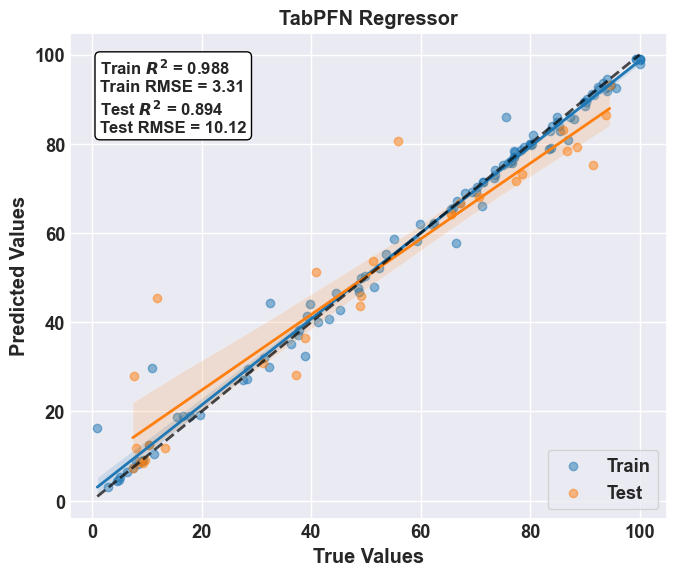

In [28]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np
from tabpfn import TabPFNRegressor

# 设置全局字体为 Arial 并加粗
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.weight'] = 'bold'
sns.set_context("notebook", font_scale=1.2, rc={"font.weight": 'bold'})

# 加载数据
df = pd.read_excel("数据集.xlsx")  # 读取 Excel 文件
X = df.drop(columns=['Y'])  # 特征数据
y = df['Y']  # 目标标签

# 划分数据集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 初始化 TabPFN 回归模型
tabpfn_model = TabPFNRegressor(device='auto')  # 自动选择设备（CPU 或 GPU）

# 训练模型
tabpfn_model.fit(X_train, y_train)

# 预测结果
y_pred_train = tabpfn_model.predict(X_train)
y_pred_test = tabpfn_model.predict(X_test)

# 计算评价指标
r2_train = r2_score(y_train, y_pred_train)
r2_test = r2_score(y_test, y_pred_test)
rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))

# 创建图形
fig, ax = plt.subplots(figsize=(7, 6))

# 绘制预测结果
ax.scatter(y_train, y_pred_train, color='#1f77b4', alpha=0.5, label="Train")
ax.scatter(y_test, y_pred_test, color='#ff7f0e', alpha=0.5, label="Test")
sns.regplot(x=y_train, y=y_pred_train, scatter=False, line_kws={'linewidth': 2}, ax=ax)
sns.regplot(x=y_test, y=y_pred_test, scatter=False, line_kws={'linewidth': 2}, ax=ax)

# 绘制参考线
min_val = min(y.min(), y_pred_train.min(), y_pred_test.min())
max_val = max(y.max(), y_pred_train.max(), y_pred_test.max())
ax.plot([min_val, max_val], [min_val, max_val], 'k--', linewidth=2, alpha=0.7)

# 添加评价指标文本
ax.text(0.05, 0.95, f"Train $R^2$ = {r2_train:.3f}\nTrain RMSE = {rmse_train:.2f}\n"
                    f"Test $R^2$ = {r2_test:.3f}\nTest RMSE = {rmse_test:.2f}",
        transform=ax.transAxes, fontsize=12, fontweight='bold', verticalalignment='top',
        bbox=dict(boxstyle="round", facecolor="white", edgecolor="black"))

# 设置标题和标签
ax.set_title('TabPFN Regressor')
ax.set_xlabel('True Values')
ax.set_ylabel('Predicted Values')
ax.legend()

# 调整布局并保存图形
plt.tight_layout()
plt.savefig("TabPFN_Regression_Results.pdf", format='pdf', bbox_inches='tight')
plt.show()


In [10]:
X_test

,C,M,H,O,Ph,NO3,CH3,OH,COOH,N,CO,Concentration,TEMP,BP,MP,VCOS,time,Cellulose,Lignin
131,3,88.0620,4,3,0,0,1,0,1,0,1,6.000000,140.00,165.0,13.80,9.300000e-01,30.00,10.1800,15.8900
19,4,116.0700,4,4,0,0,0,2,2,0,2,40.000000,80.00,275.0,135.50,1.000000e-06,120.00,27.0400,37.7200
81,10,239.2500,9,4,2,1,0,1,0,1,0,9.000000,130.00,466.0,295.00,4.700000e-03,60.00,8.6200,20.0600
96,8,152.1500,8,3,1,0,0,1,1,0,1,6.000000,140.00,321.8,119.00,1.600000e-05,60.00,5.8300,9.1200
56,0,63.0100,1,3,0,0,0,0,0,1,0,1.000000,160.00,83.0,-42.00,3.066000e+01,20.00,32.5152,23.7333
12,2,60.0520,2,6,0,1,1,3,1,0,3,80.000000,107.00,337.0,10.37,6.670000e+01,90.00,18.4100,90.5346
98,8,152.1500,8,3,1,0,0,1,1,0,1,8.000000,140.00,321.8,119.00,1.600000e-05,60.00,9.1700,13.7400
65,5,116.1150,8,3,0,0,1,0,1,0,1,7.000000,160.00,242.9,37.20,1.330000e-01,60.00,9.3400,53.3400
66,5,116.1150,8,3,0,0,1,0,1,0,1,7.000000,170.00,242.9,37.20,1.330000e-01,60.00,9.6300,72.4300
18,2,60.0520,2,14,0,1,1,3,1,0,3,80.000000,107.00,337.0,10.37,6.670000e+01,60.00,11.8589,94.5251


In [11]:
from sklearn.inspection import partial_dependence
from scipy.interpolate import splrep, splev

def plot_partial_dependence(model, X, features, grid_resolution=50, sample_size=100):
    """
    绘制一个或多个特征的偏依赖图（Partial Dependence Plot）。
    
    参数:
    - model: 训练好的机器学习模型
    - X: 特征数据 (DataFrame)
    - features: 要绘制的特征，可以是一个字符串（单个特征）或列表（多个特征）
    - grid_resolution: 网格分辨率（默认50）
    - sample_size: Rugplot中用于展示分布的样本数（默认100）
    """
    # 确保 features 是一个列表
    if isinstance(features, str):
        features = [features]
    
    for i in features:
        # 计算偏依赖
        pdp_result = partial_dependence(
            model, X, [i], kind="both", grid_resolution=grid_resolution
        )
        
        # 提取偏依赖数据
        plot_x = pd.Series(pdp_result.grid_values[0]).rename('x')  # 特征值
        plot_y = pd.Series(pdp_result.average[0]).rename('y')      # 平均偏依赖数据
        plot_i = pdp_result.individual                            # 个体曲线数据
        
        # 平滑曲线
        tck = splrep(plot_x, plot_y, s=30)
        xnew = np.linspace(plot_x.min(), plot_x.max(), 300)
        ynew = splev(xnew, tck, der=0)
        
        # 准备个体数据
        plot_df_list = []
        if plot_i is not None:  # 如果存在个体偏依赖数据
            for a in plot_i[0]:
                a2 = pd.Series(a)
                df_i = pd.concat([plot_x, a2.rename('y')], axis=1)
                plot_df_list.append(df_i)
            plot_df = pd.concat(plot_df_list, ignore_index=True)
        else:
            plot_df = pd.DataFrame(columns=['x', 'y'])
        
        # 设置绘图样式
        sns.set_theme(style="ticks", palette="deep", font_scale=1.1)
        plt.rcParams['font.family'] = 'Times New Roman'
        plt.rcParams['axes.unicode_minus'] = False
        fig = plt.figure(figsize=(6, 5), dpi=100)
        ax = plt.subplot(111)
        
        # 绘制个体曲线
        if not plot_df.empty:  # 只有在个体数据不为空时绘制
            sns.lineplot(data=plot_df, x="x", y="y", color='k', linewidth=1.5, linestyle='--', alpha=0.6)
        
        # 绘制平均偏依赖曲线
        plt.plot(xnew, ynew, linewidth=2)
        
        # 绘制 Rugplot（边际分布）
        sns.rugplot(data=X.sample(sample_size), x=i, height=0.05, color='k', alpha=0.3)
        
        # 设置标题和轴标签
        x_min = plot_x.min() - (plot_x.max() - plot_x.min()) * 0.1
        x_max = plot_x.max() + (plot_x.max() - plot_x.min()) * 0.1
        plt.ylabel('Partial Dependence')
        plt.xlabel(i)
        plt.xlim(x_min, x_max)
        plt.savefig(f"Partial Dependence Plot of {i}.pdf", format='pdf', bbox_inches='tight', dpi=1200)
        plt.show()

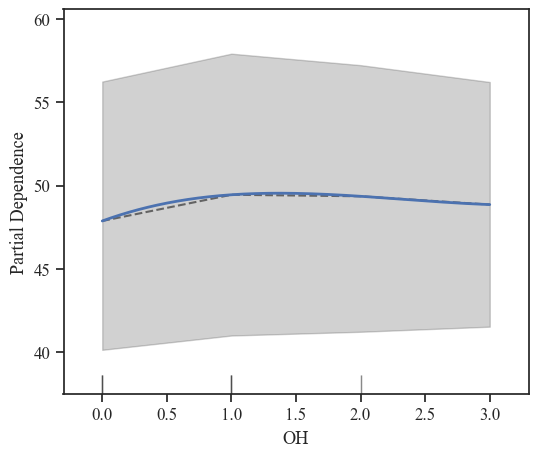

In [13]:
plot_partial_dependence(model, X_test, 'Feature 1', sample_size=10)

In [20]:
import tabpfn
print(tabpfn.__version__)


2.0.8


In [21]:
import sys
print(sys.executable)

C:\Users\79971\miniconda3\envs\test_env_1\python.exe


In [6]:
# !pip install tabpfn_extensions

In [22]:
from tabpfn_extensions import interpretability

In [30]:
import joblib
import pandas as pd
from tabpfn_extensions import interpretability

# 1. 加载测试数据（只保留特征列）
df_test = pd.read_excel("数据集.xlsx")    # 如果你已经有 X_test 就不需要这步
X_test = df_test.drop(columns=['Y'])     # 假设原表里有 Y，需要先删掉

# 2. 加载之前训练并保存好的模型
model = joblib.load(r"C:\Users\79971\Desktop\用到的代码\Nature新算法：准确的小数据预测与表格基础模型TabPFN回归实现及其模型解释(1)\Nature新算法：准确的小数据预测与表格基础模型TabPFN回归实现及其模型解释\tabpfn_model.joblib")
  # 确保文件名和路径正确

# 3. 计算 SHAP 值
shap_values = interpretability.shap.get_shap_values(
    estimator=model,
    test_x=X_test,  # ← 不加 .values
    attribute_names=list(X_test.columns),
    algorithm="permutation"
) # 括号在这里闭合！


C:\Users\79971\miniconda3\envs\test_env_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but TabPFNRegressor was fitted with feature names
  warnings.warn(
C:\Users\79971\miniconda3\envs\test_env_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but TabPFNRegressor was fitted with feature names
  warnings.warn(
C:\Users\79971\miniconda3\envs\test_env_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but TabPFNRegressor was fitted with feature names
  warnings.warn(
C:\Users\79971\miniconda3\envs\test_env_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but TabPFNRegressor was fitted with feature names
  warnings.warn(
C:\Users\79971\miniconda3\envs\test_env_1\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but TabPFNRe

In [31]:
X_test.shape

(142, 19)

In [32]:
shap_values

.values =
array([[ 7.72990783,  3.11069171,  4.59198221, ..., -3.07356389,
         1.51809629,  0.58243608],
       [ 8.57519062,  3.21304099,  6.43324598, ..., -2.01713212,
        -2.83239492,  0.83386421],
       [ 7.45302391,  3.04986254,  4.96288172, ..., -1.51896795,
         1.00572856,  0.03215138],
       ...,
       [11.60275523,  5.92304556,  7.25765586, ...,  0.21485043,
        -2.07435751,  2.26456118],
       [10.95809921,  5.62950285,  7.72590764, ...,  0.20780595,
         0.78065968,  0.63253784],
       [13.18058785,  6.74134843,  7.3340989 , ..., -0.33082   ,
         2.51852425, -0.22568647]])

.base_values =
array([36.30724335, 36.30724335, 36.30724335, 36.30724335, 36.30724335,
       36.30724335, 36.30724335, 36.30724335, 36.30724335, 36.30724335,
       36.30724335, 36.30724335, 36.30724335, 36.30724335, 36.30724335,
       36.30724335, 36.30724335, 36.30724335, 36.30724335, 36.30724335,
       36.30724335, 36.30724335, 36.30724335, 36.30724335, 36.30724335,
 

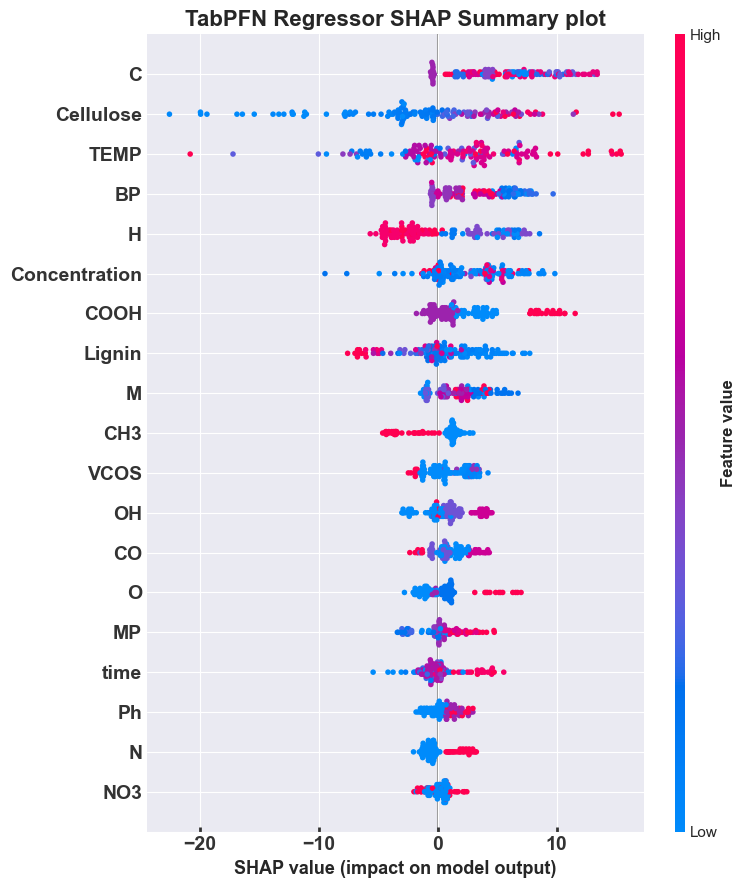

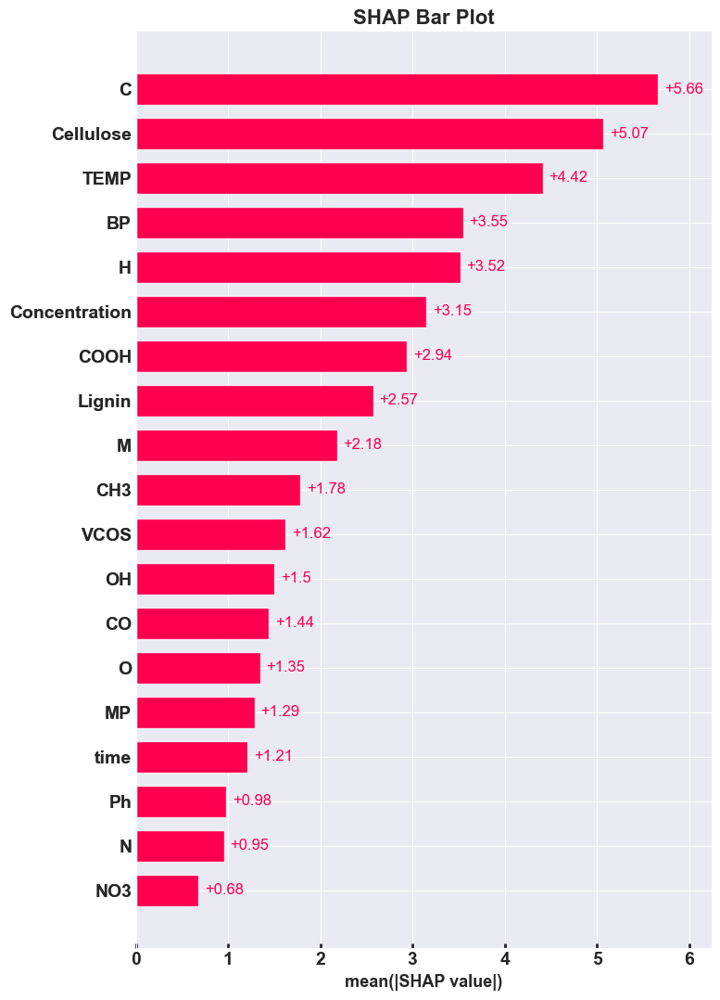

In [34]:
import shap
import matplotlib.pyplot as plt
from matplotlib import rcParams

# 设置全局字体为 Arial，字体大小为 14，并且加粗
rcParams['font.family'] = 'Arial'  # 设置字体家族为 Arial
rcParams['font.size'] = 14  # 设置字体大小为 14
rcParams['axes.labelweight'] = 'bold'  # 设置轴标签加粗
rcParams['axes.titleweight'] = 'bold'  # 设置标题加粗
rcParams['axes.labelsize'] = 14  # 设置坐标轴标签字体大小
rcParams['axes.titlesize'] = 16  # 设置标题字体大小
rcParams['xtick.labelsize'] = 14  # 设置x轴刻度标签字体大小
rcParams['ytick.labelsize'] = 14  # 设置y轴刻度标签字体大小
rcParams['xtick.direction'] = 'in'  # 设置刻度方向
rcParams['ytick.direction'] = 'in'  # 设置刻度方向

# ——— 可视化 SHAP 值 ———
# a) Summary/Beeswarm Plot
plt.figure(figsize=(8, 6))
shap.plots.beeswarm(shap_values, max_display=len(shap_values.feature_names), show=False)  # 显示所有特征
fig_beeswarm = plt.gcf()   # 获取当前的 Figure 对象
plt.title('TabPFN Regressor SHAP Summary plot', fontsize=16, fontweight='bold')

# 修改字体样式，确保加粗
plt.gca().tick_params(axis='both', which='major', labelsize=14, width=2)  # 设置坐标轴数字加粗
for label in plt.gca().get_xticklabels() + plt.gca().get_yticklabels():
    label.set_fontname('Arial')  # 设置字体为 Arial
    label.set_fontweight('bold')  # 设置字体加粗

# 修改特征名称字体（x轴标签）
for label in plt.gca().get_xticklabels():
    label.set_fontname('Arial')  # 设置特征名称字体为 Arial
    label.set_fontweight('bold')  # 设置特征名称加粗

plt.tight_layout()  # 调整布局以避免重叠
fig_beeswarm.savefig("34.png", dpi=300, bbox_inches='tight')
plt.savefig("35.pdf", format='pdf', bbox_inches='tight')

# b) Bar Plot
plt.figure(figsize=(8, 6))
shap.plots.bar(shap_values, max_display=len(shap_values.feature_names), show=False)  # 显示所有特征
fig_bar = plt.gcf()         # 再次获取当前 Figure
plt.title('SHAP Bar Plot', fontsize=16, fontweight='bold')

# 修改字体样式，确保加粗
plt.gca().tick_params(axis='both', which='major', labelsize=14, width=2)  # 设置坐标轴数字加粗
for label in plt.gca().get_xticklabels() + plt.gca().get_yticklabels():
    label.set_fontname('Arial')  # 设置字体为 Arial
    label.set_fontweight('bold')  # 设置字体加粗

# 修改特征名称字体（x轴标签）
for label in plt.gca().get_xticklabels():
    label.set_fontname('Arial')  # 设置特征名称字体为 Arial
    label.set_fontweight('bold')  # 设置特征名称加粗

plt.tight_layout()  # 调整布局以避免重叠
fig_bar.savefig("shap_bar.png", dpi=300, bbox_inches='tight')
plt.savefig("2.1.pdf", format='pdf', bbox_inches='tight')
plt.show()


In [19]:
X_test.columns.tolist()


['C',
 'M',
 'H',
 'O',
 'Ph',
 'NO3',
 'CH3',
 'OH',
 'COOH',
 'N',
 'CO',
 'Concentration',
 'TEMP',
 'BP',
 'MP',
 'VCOS',
 'time',
 'Cellulose',
 'Lignin']

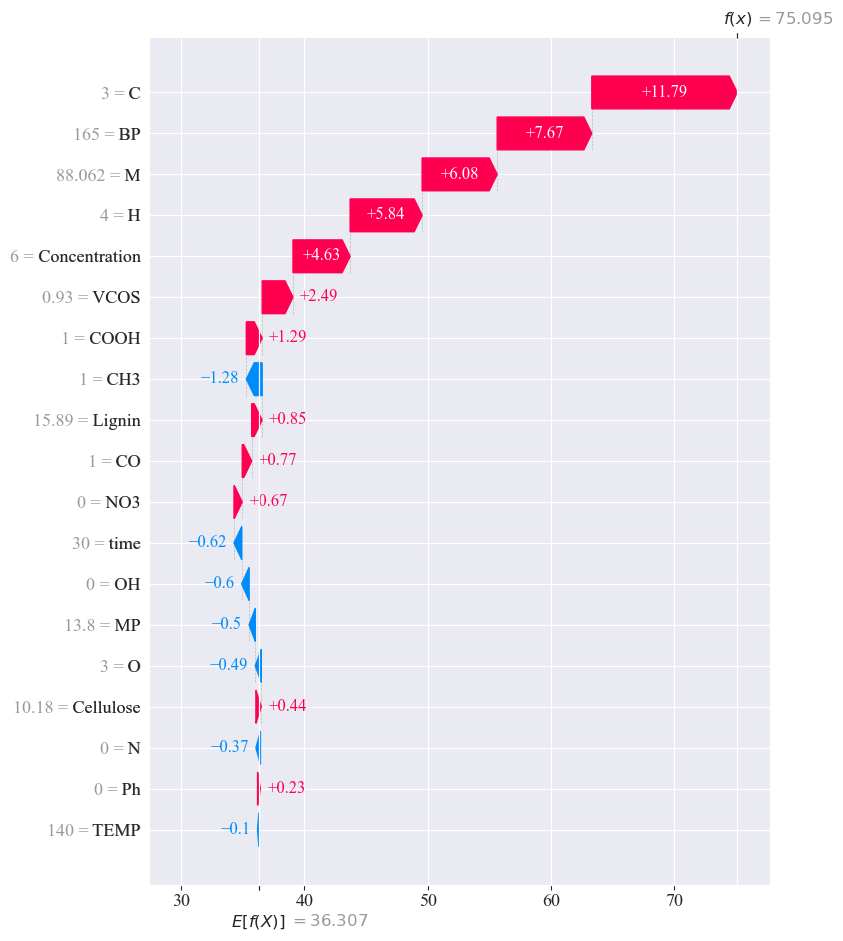

In [20]:
import  shap
shap.plots.waterfall(shap_values[0], max_display=99, show=False)
plt.show()

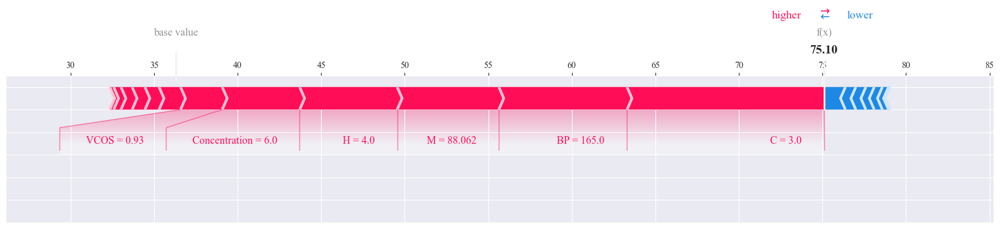

In [21]:
shap.plots.force(shap_values[0], show=False, matplotlib=True)
plt.show()

In [22]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
# Predict quantiles
quantiles = [0.25, 0.5, 0.75]
quantile_predictions = model.predict(
    X_test,
    output_type="quantiles",
    quantiles=quantiles,
)
for q, q_pred in zip(quantiles, quantile_predictions):
    print(f"Quantile {q} MAE:", mean_absolute_error(y_test, q_pred))

Quantile 0.25 MAE: 7.89573027547437
Quantile 0.5 MAE: 5.1670375984049945
Quantile 0.75 MAE: 6.717932446771667


In [23]:
X_demo = [1 for i in range(0,19)]
X_demo = pd.DataFrame(X_demo)
# 将 DataFrame 转置为1行19列
X_demo = X_demo.transpose()
x_demo_predict = model.predict(X_demo)
X_demo

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [36]:
x_demo_predict

array([38.887928], dtype=float32)

In [24]:
import pickle
# 保存模型
with open('model.pkl', 'wb') as file:
    pickle.dump(model, file)

In [25]:
# model = TabPFNRegressor()
# 加载模型
with open('model.pkl', 'rb') as file:
    model = pickle.load(file)

In [26]:
X_demo = [1 for i in range(0,19)]
X_demo = pd.DataFrame(X_demo)
# 将 DataFrame 转置为1行19列
X_demo = X_demo.transpose()
x_demo_predict = model.predict(X_demo)
x_demo_predict

array([38.887928], dtype=float32)

In [ ]:
import pandas as pd

# 检查X_test是否是DataFrame，并且有列名
if isinstance(X_test, pd.DataFrame):
    # X_test已经是带列名的DataFrame
    print("X_test is a valid DataFrame with feature names.")
else:
    # 如果X_test不是DataFrame，或者没有列名
    raise ValueError("X_test must be a pandas DataFrame with feature names!")

# 进行SHAP值计算
shap_values = interpretability.shap.get_shap_values(
    estimator=model,
    test_x=X_test,  # 保持DataFrame格式
    attribute_names=list(X_test.columns),  # 列名传递给SHAP
    algorithm="permutation"
)


In [28]:
import joblib
import os # 导入 os 模块来处理路径

# 注意：Windows 路径中的反斜杠 \ 可能需要转义或使用原始字符串

# 方法一：使用原始字符串 (推荐)
model_path = r"C:\Users\79971\Desktop\用到的代码\Nature新算法：准确的小数据预测与表格基础模型TabPFN回归实现及其模型解释(1)\Nature新算法：准确的小数据预测与表格基础模型TabPFN回归实现及其模型解释\tabpfn_model.joblib"

# 方法二：转义反斜杠
# model_path = "C:\\Users\\79971\\Desktop\\用到的代码\\Nature新算法：准确的小数据预测与表格基础模型TabPFN回归实现及其模型解释(1)\\Nature新算法：准确的小数据预测与表格基础模型TabPFN回归实现及其模型解释\\tabpfn_model.joblib"

# 方法三：使用正斜杠 (Python 通常能处理 Windows 路径中的正斜杠)
# model_path = "C:/Users/79971/Desktop/用到的代码/Nature新算法：准确的小数据预测与表格基础模型TabPFN回归实现及其模型解释(1)/Nature新算法：准确的小数据预测与表格基础模型TabPFN回归实现及其模型解释/tabpfn_model.joblib"


# 检查文件是否存在
if os.path.exists(model_path):
    try:
        # 加载模型
        model = joblib.load(model_path)

        # --- 查看模型信息 ---

        # 1. 打印模型对象本身，通常会显示模型类型和主要参数
        print("Loaded model object:")
        print(model)

        # 2. 如果是 Scikit-learn 兼容的模型，尝试获取参数
        if hasattr(model, 'get_params'):
            print("\nModel Parameters (Hyperparameters):")
            try:
                print(model.get_params())
            except Exception as e:
                print(f"Could not get parameters: {e}")

        # 3. 尝试查看模型学习到的属性 (例如系数、特征重要性等)
        # 注意：这些属性的名称取决于具体的模型类型
        print("\nAttempting to check learned attributes:")
        attributes_to_check = ['coef_', 'intercept_', 'feature_importances_', 'classes_']
        for attr in attributes_to_check:
            if hasattr(model, attr):
                try:
                    print(f"- {attr}: {getattr(model, attr)}")
                except Exception as e:
                    print(f"Could not access attribute {attr}: {e}")

        # 对于 TabPFN 这种特定模型，可能需要查阅其文档或源代码
        # 来了解如何查看其内部结构或预测函数
        print("\nFor detailed inspection of TabPFN, refer to its specific documentation.")


    except Exception as e:
        print(f"Error loading or inspecting the model: {e}")
        print("Please ensure you have all necessary libraries installed (e.g., scikit-learn, tabpfn) and that the .joblib file is not corrupted.")
else:
    print(f"Error: The file path does not exist: {model_path}")
    print("Please double-check the path.")

Loaded model object:
TabPFNRegressor()

Model Parameters (Hyperparameters):
{'average_before_softmax': False, 'categorical_features_indices': None, 'device': 'auto', 'fit_mode': 'fit_preprocessors', 'ignore_pretraining_limits': False, 'inference_config': None, 'inference_precision': 'auto', 'memory_saving_mode': 'auto', 'model_path': 'auto', 'n_estimators': 8, 'n_jobs': -1, 'random_state': 0, 'softmax_temperature': 0.9}

Attempting to check learned attributes:

For detailed inspection of TabPFN, refer to its specific documentation.


In [29]:
print(type(X_test))          # 应该是 <class 'pandas.core.frame.DataFrame'>
print(X_test.columns)        # 看看列名是不是对的


<class 'pandas.core.frame.DataFrame'>
Index(['C', 'M', 'H', 'O', 'Ph', 'NO3', 'CH3', 'OH', 'COOH', 'N', 'CO',
       'Concentration', 'TEMP', 'BP', 'MP', 'VCOS', 'time', 'Cellulose',
       'Lignin'],
      dtype='object')
